# **Data Features**

## **Catagorical variables**

*   **person_home_ownership**: The home ownership status provided by the borrower (Rent, own, mortage, other)
*   **loan_intent**:A catagory provided by the borrower for loan (personal, educational, medical, venture, debt consolidation, home improvement)
*   **loan_grade**:Loan grade assigned (A,B,C,D,E,F,G)
*   **cb_person_default_on_file**: Yes or No





# **Numerical variables**

*   **Person Age**: Age of the person
*   **Person_income**:Income of the borrower
*   **Person Emp Length**: Employement length of the borrower in years
*   **Loan amount**: Loan requested by the borrower
*   **Loan Interest Rate**:Interest rate on loan requested
*   **Loan Percent Income**
*   **CB person credit history length**



# **Dependent Variable**

*   **Loan Status**: 0(non default), 1(default) 



# **Importing Libraries**


In [1]:
import sys
!conda install --yes --prefix {sys.prefix} plotly

Solving environment: ...working... done

# All requested packages already installed.





==> WARNING: A newer version of conda exists. <==
  current version: 4.9.2
  latest version: 23.1.0

Please update conda by running

    $ conda update -n base -c defaults conda




In [2]:
import sys
!{sys.executable} -m pip install xgboost

In [3]:
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np

# Feature Engineering and Selection
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Data Modeling
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
#from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

# Evaluation metrics
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report

In [4]:
dt= pd.read_csv("F:\SEM7\Project\Actual Project Codes\credit_risk_dataset.csv");

# **Data Exploration**

In [5]:
dt

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


In [6]:
dt.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


Data Preprocessing(Missing Values)

In [7]:
dt.tail()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26
32580,66,42000,RENT,2.0,MEDICAL,B,6475,9.99,0,0.15,N,30


In [8]:
dt.shape

(32581, 12)

In [9]:
dt.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [10]:
dt.columns

Index(['person_age', 'person_income', 'person_home_ownership',
       'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_default_on_file', 'cb_person_cred_hist_length'],
      dtype='object')

In [11]:
dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


# **Data Inspection**

In [12]:
dt.duplicated().sum()

165

In [13]:
dt.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
32576    False
32577    False
32578    False
32579    False
32580    False
Length: 32581, dtype: bool

In [14]:
dt.duplicated().value_counts()

False    32416
True       165
dtype: int64

In [15]:
dt=dt.drop_duplicates()

In [16]:
dt.duplicated().sum()


0

In [17]:
dt.duplicated().value_counts()

False    32416
dtype: int64

In [18]:
dt.isnull().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              887
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3095
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [19]:
dt = dt.dropna(axis=0)

In [20]:
dt.isnull().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [21]:
dt.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,28501.000000,2.850100e+04,28501.000000,28501.000000,28501.000000,28501.000000,28501.000000,28501.000000
mean,27.738676,6.665441e+04,4.790148,9658.533034,11.045385,0.217115,0.169517,5.800498
std,6.316166,6.237603e+04,4.157462,6329.604672,3.230748,0.412289,0.106410,4.042153
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.950000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.600000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,8.000000e+04,7.000000,12500.000000,13.480000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [22]:
dt_0=(dt[dt.loan_status==0].loan_status.count() / dt.loan_status.count())*100
dt_0

78.28848110592611

######percent of loan_status default



```

```

# **Determining Outliers**

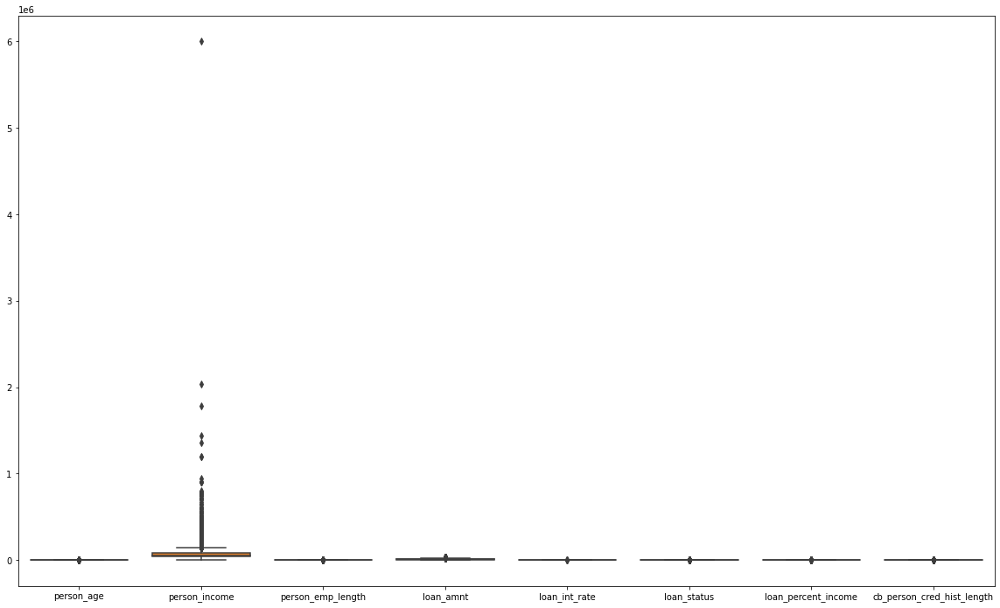

In [23]:
plt.figure(figsize=(20,12))
sns.boxplot(data=dt)
plt.show()

In [24]:
fig = px.scatter_matrix(dt, dimensions=
["person_age","person_income","person_emp_length","loan_amnt","loan_int_rate"],
labels={col:col.replace('_', ' ') for col in dt.columns},height=800, color="loan_status", color_continuous_scale=px.colors.diverging.Tealrose)
fig.show()

Removing Outliers

In [25]:
dt= dt[dt['person_age']<=100]
dt= dt[dt['person_emp_length']<=100]
dt= dt[dt['person_income']<=4000000]

In [26]:
fig = px.scatter_matrix(dt, dimensions=
["person_age","person_income","person_emp_length","loan_amnt","loan_int_rate"],
labels={col:col.replace('_', ' ') for col in dt.columns},height=800, color="loan_status", color_continuous_scale=px.colors.diverging.Tealrose)
fig.show()

# **Exploratory Data Analysis**

##**Dependent Variable**

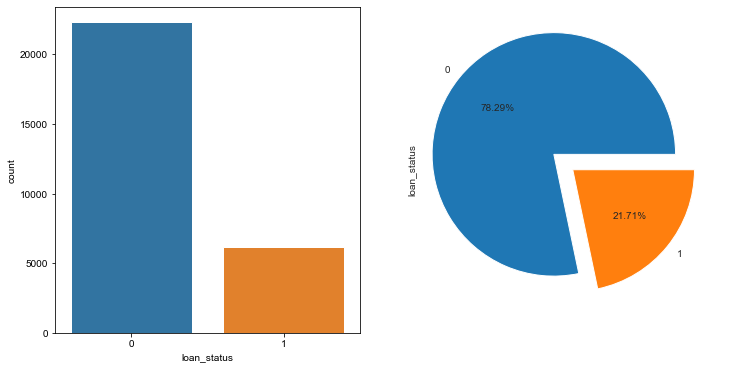

In [27]:
plt.subplots(figsize=(12,6))

plt.subplot(1,2,1)#1 row,2 columns,1st plot
sns.set_style('whitegrid')
sns.countplot(x='loan_status',data=dt)

plt.subplot(1,2,2)#1 row,2 columns, 2nd plot
dt['loan_status'].value_counts().plot.pie(autopct='%1.2f%%',explode=[0.2,0])

plt.show()

In [28]:
dt['loan_status'].value_counts()

0    22308
1     6187
Name: loan_status, dtype: int64

The distribution of our target variable is shown. The count of person whose loan status is non default(0) is more compared to default(1) 

##**Univariate Analysis**

**Catagorical Variables**

In [29]:
#categorical variables
cata_vari=['person_home_ownership','cb_person_default_on_file','loan_grade','loan_intent']

In [30]:
print("unique values:")
for col in cata_vari:
  print(f"{col} - {dt[col].unique()}")
  print("-"*25)

unique values:
person_home_ownership - ['OWN' 'MORTGAGE' 'RENT' 'OTHER']
-------------------------
cb_person_default_on_file - ['N' 'Y']
-------------------------
loan_grade - ['B' 'C' 'A' 'D' 'E' 'F' 'G']
-------------------------
loan_intent - ['EDUCATION' 'MEDICAL' 'VENTURE' 'PERSONAL' 'HOMEIMPROVEMENT'
 'DEBTCONSOLIDATION']
-------------------------


In [31]:
for col in cata_vari:
  print(f"{col} - value counts")
  print(dt[col].value_counts())
  print("-"*30)

person_home_ownership - value counts
RENT        14495
MORTGAGE    11733
OWN          2174
OTHER          93
Name: person_home_ownership, dtype: int64
------------------------------
cb_person_default_on_file - value counts
N    23406
Y     5089
Name: cb_person_default_on_file, dtype: int64
------------------------------
loan_grade - value counts
A    9344
B    9092
C    5680
D    3242
E     869
F     209
G      59
Name: loan_grade, dtype: int64
------------------------------
loan_intent - value counts
EDUCATION            5668
MEDICAL              5269
VENTURE              4967
PERSONAL             4857
DEBTCONSOLIDATION    4547
HOMEIMPROVEMENT      3187
Name: loan_intent, dtype: int64
------------------------------


<ipython-input-32-bf8071d1eebc>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-32-bf8071d1eebc>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-32-bf8071d1eebc>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-32-bf8071d1eebc>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.



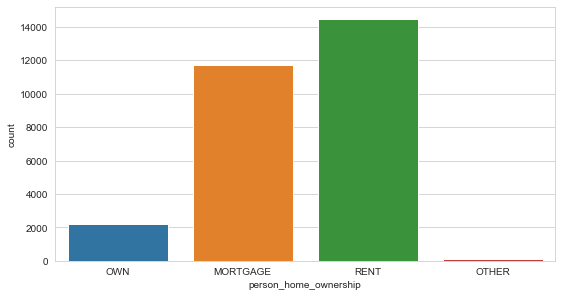

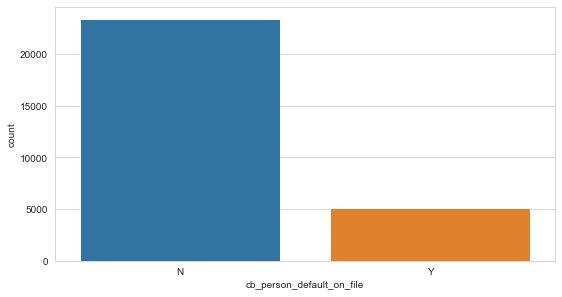

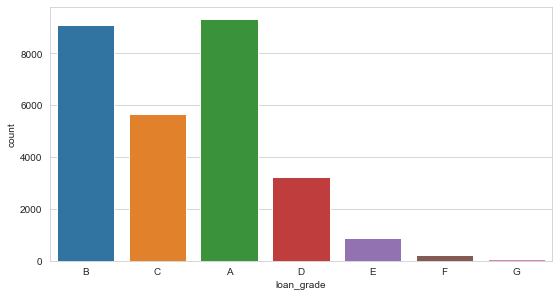

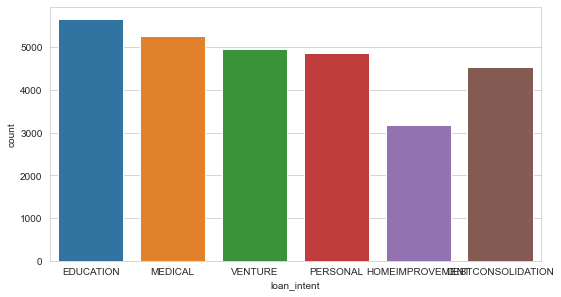

In [32]:
# count plot
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2


for i in range(1,len(l)+1):
    plt.figure(figsize=(15,12))
    plt.subplot(number_of_rows+1,number_of_columns,i)
    sns.countplot(data= dt[cata_vari],x=dt[cata_vari][l[i-1]])
    # plt.title(l[i-1])
    plt.tight_layout()

<ipython-input-33-26a87cbae4b4>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-33-26a87cbae4b4>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-33-26a87cbae4b4>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-33-26a87cbae4b4>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.



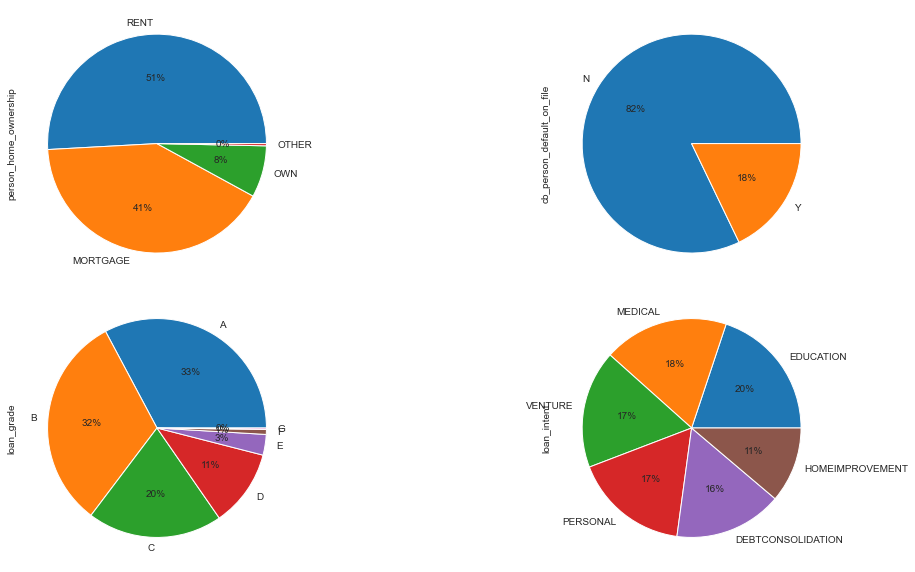

In [33]:
#pie chart
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
    plt.subplot(number_of_rows+1,number_of_columns,i)
    dt[cata_vari][l[i-1]].value_counts().plot.pie(autopct='%1.0f%%')
    # plt.title(l[i-1])
    plt.tight_layout()

"cb_person_on_default_file" is imbalanced and would not contribute much in predicting.

**Continuous Variables**

In [34]:
# contineous variables
conti_vari=['person_age','person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']

<ipython-input-35-8da0850a7819>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

<ipython-input-35-8da0850a7819>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an 

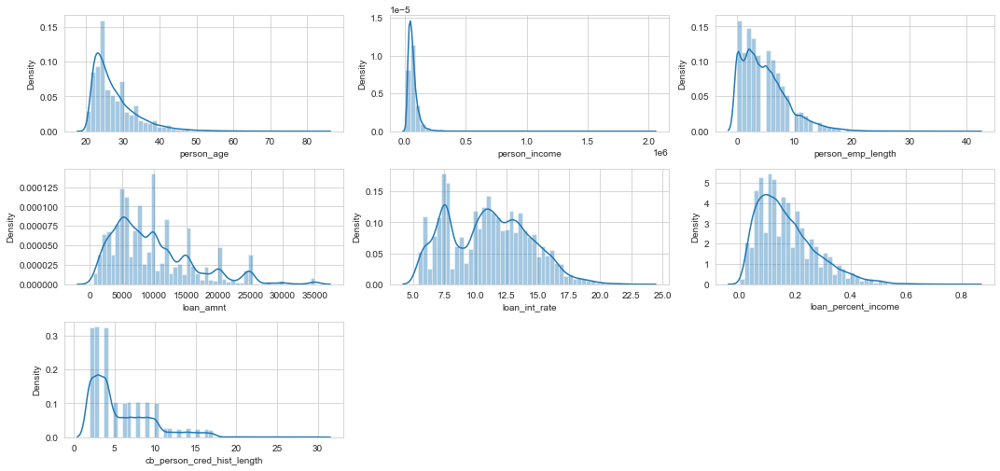

In [35]:
 # distribution check
def check_dist(df):
    l = df.columns.values
    number_of_columns=(len(l))/2
    number_of_rows = 3
    
    plt.figure(figsize=(15,9))
    for i in range(1,len(l)+1):
        plt.subplot(number_of_rows+1,number_of_columns,i)
        # sns.histplot(df[l[i-1]],kde=True,stat="density", linewidth=0) 
        sns.distplot(df[l[i-1]],kde=True) 
        plt.tight_layout()
        
check_dist(dt[conti_vari])

These distributions show that these graphs aare mostly right skewed.

<ipython-input-36-a97c09f3c787>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-36-a97c09f3c787>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-36-a97c09f3c787>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-36-a97c09f3c787>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-36-a97c09f3c787>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-i

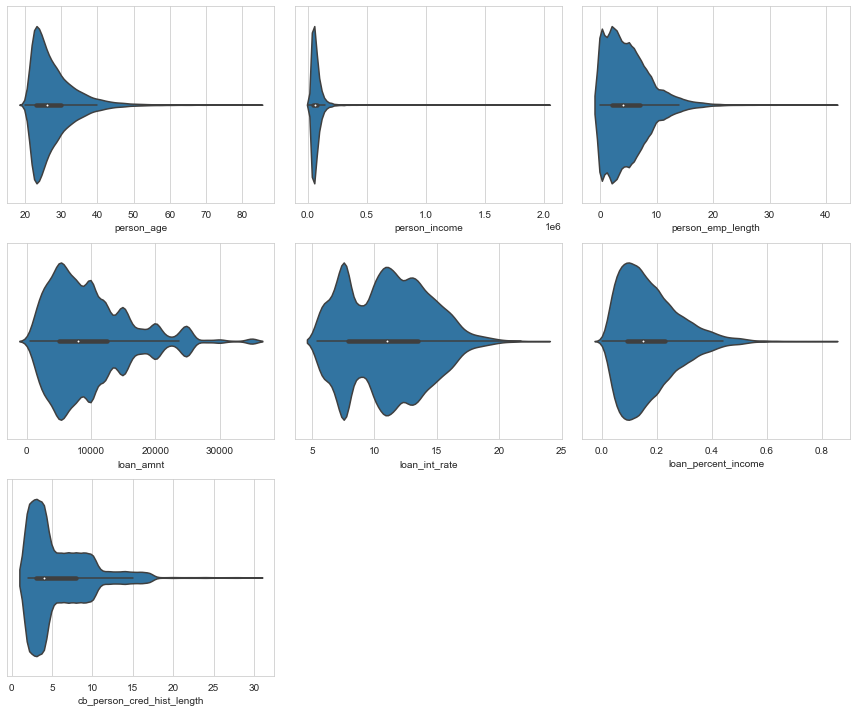

In [36]:
l = dt[conti_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows = 2

plt.figure(figsize=(12,10))
for i in range(1,len(l)+1):
    plt.subplot(number_of_rows+1,number_of_columns,i)
    sns.violinplot(x=dt[conti_vari][l[i-1]])
    plt.tight_layout() 

<ipython-input-37-1a1211dc0bec>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-37-1a1211dc0bec>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-37-1a1211dc0bec>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-37-1a1211dc0bec>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-37-1a1211dc0bec>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-i

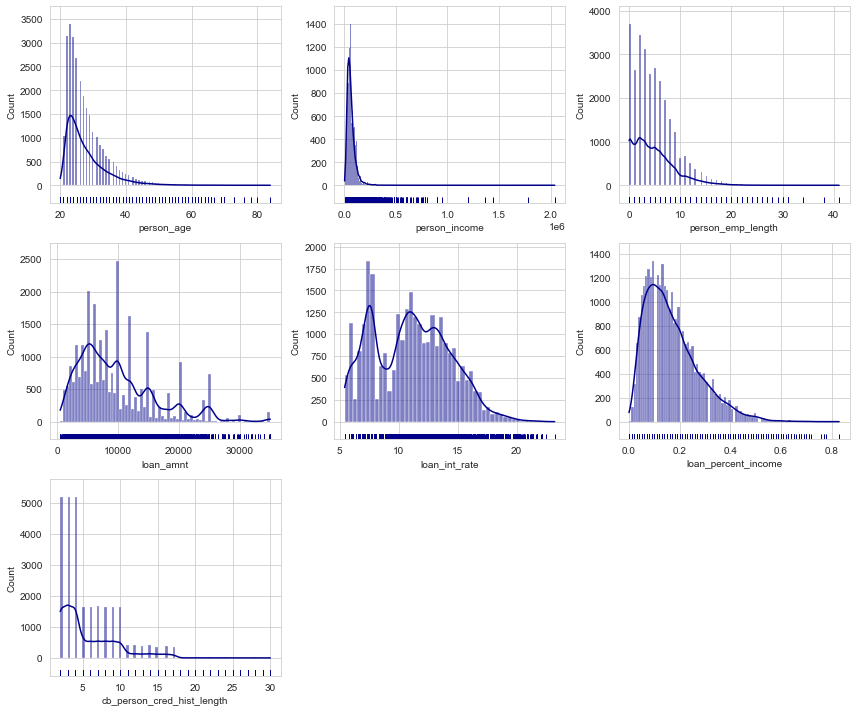

In [37]:
l = dt[conti_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows = 2

plt.figure(figsize=(12,10))
for i in range(1,len(l)+1):
    plt.subplot(number_of_rows+1,number_of_columns,i)
    sns.rugplot(x=dt[conti_vari][l[i-1]],data=dt,height=.03,color='darkblue')
    sns.histplot(x=dt[conti_vari][l[i-1]],data=dt,kde=True,color='darkblue')
    plt.tight_layout() 

In [38]:
dt_non_default=dt.loc[dt['loan_status']==0]
dt_default=dt.loc[dt['loan_status']==1]

In [39]:
# plt.plot(dt_non_default['person_income'],np.zeros_like(dt_non_default['person_income']),'o')
# plt.plot(dt_default['person_income'],np.zeros_like(dt_default['person_income']),'o')#orange
# plt.xlabel('Person_income')
# plt.show()

## **Bivariate Analysis**

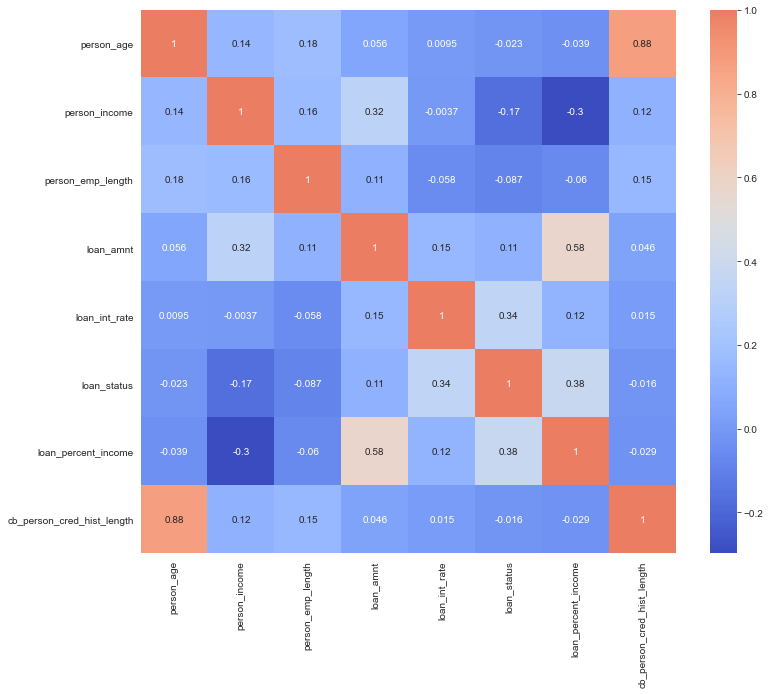

In [40]:
fig, axes=plt.subplots(1,1,figsize=(12,10))    #tupple unpacking
sns.heatmap(dt.corr(), annot=True, cmap='coolwarm', ax=axes, center=0.5)
plt.show()

In [41]:
dt.corr()['loan_status'].sort_values()

person_income                -0.167803
person_emp_length            -0.086718
person_age                   -0.023267
cb_person_cred_hist_length   -0.016485
loan_amnt                     0.113965
loan_int_rate                 0.339952
loan_percent_income           0.379845
loan_status                   1.000000
Name: loan_status, dtype: float64

## catagorical bivariate


<ipython-input-42-5db2481d5ae5>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-42-5db2481d5ae5>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-42-5db2481d5ae5>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-42-5db2481d5ae5>:9: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.



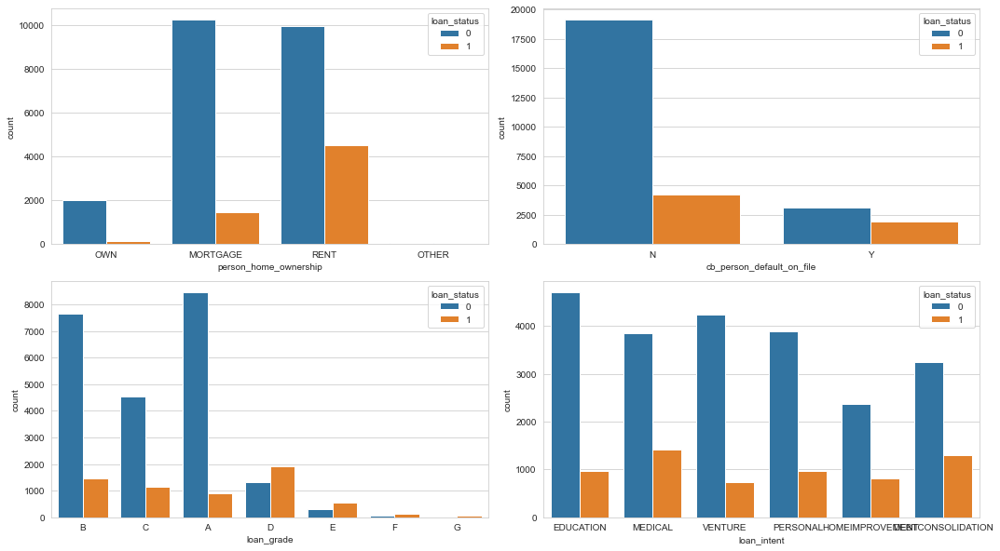

In [42]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  # if l[i]==l[3]:
  #   continue
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # dt[cata_vari][l[i-1]].value_counts().plot.bar()
  sns.countplot(x=l[i-1],hue=dt['loan_status'],data=dt)
  # plt.title(l[i-1])
  plt.tight_layout()

# l=dt[cata_vari].columns.values
# sns.countplot(x=l[0],hue=dt['loan_status'],data=dt)
# plt.plot()


As we go from grade A to G the default rate increases.

### comparing all the catagorical variables with eachother.

In [43]:
#Parallel category diagram
fig = px.parallel_categories(dt[cata_vari], color_continuous_scale=px.colors.sequential.RdBu, color=dt['loan_status'],
dimensions=[dt['person_home_ownership'],dt['loan_intent'], dt['loan_grade'], dt['cb_person_default_on_file']], labels={col:col.replace('_', ' ') for col in dt.columns})
fig.show()



*   Dataset is primarily composed of borrowers who have not defaulted on a loan before.

*   Loan grades “A” and “B” are the most common grades while “F” and “G” are the least common.

*   Home renters defaulted more often on their loans than those with a mortgage, whereas homeowners defaulted the least.


*   Defaults were more common for loans that were taken up for covering medical expenses and debt consolidation.



## continuous variables


In [44]:
conti_vari1=['person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']

<ipython-input-45-e9766b4d4c4f>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-45-e9766b4d4c4f>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

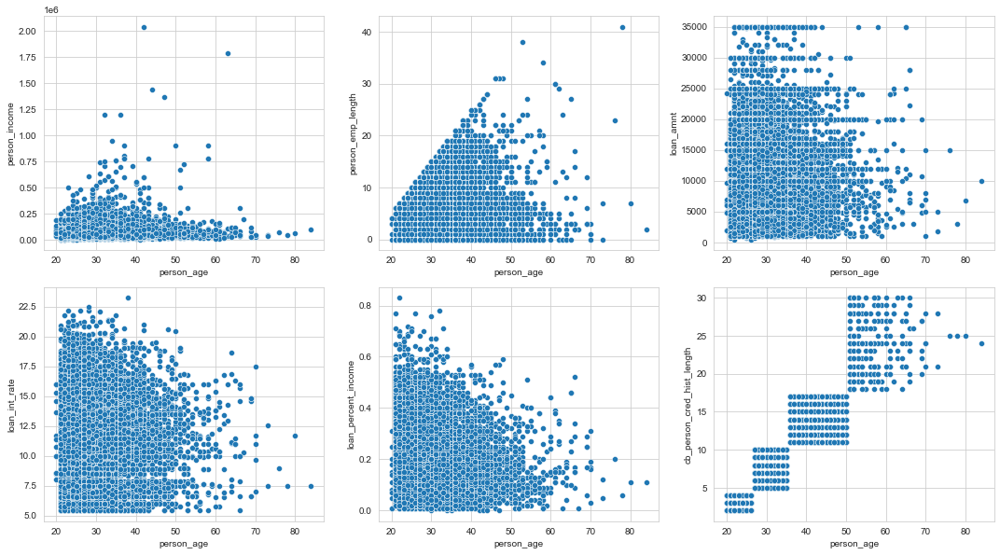

In [45]:
l=dt[conti_vari1].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  sns.scatterplot(dt['person_age'],dt[conti_vari1][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

In [46]:
conti_vari2=['person_age','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']

<ipython-input-47-25fad4e46524>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-47-25fad4e46524>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

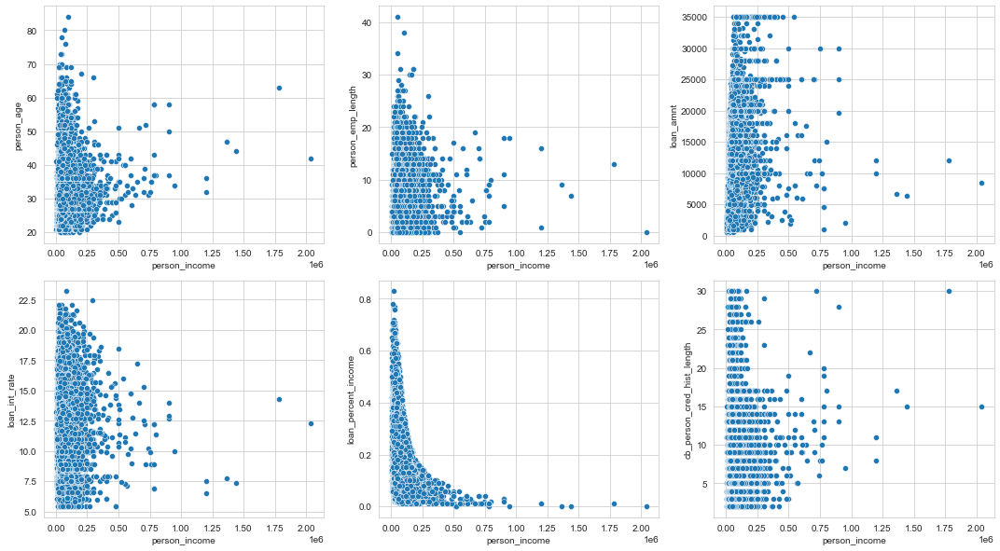

In [47]:
l=dt[conti_vari2].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  sns.scatterplot(dt['person_income'],dt[conti_vari2][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

In [48]:
conti_vari3=['person_age','person_income','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']

<ipython-input-49-6c05c78488f2>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-49-6c05c78488f2>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

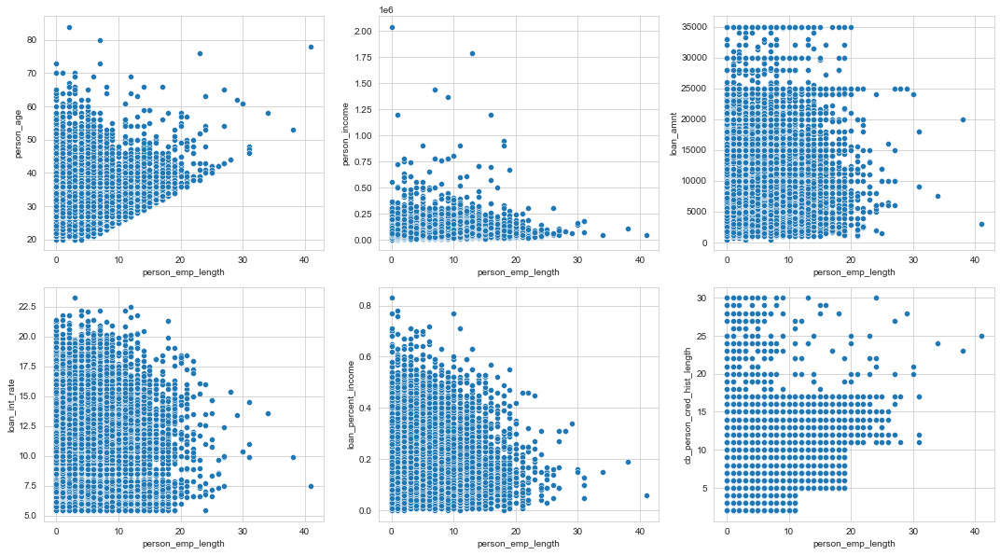

In [49]:
l=dt[conti_vari3].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  sns.scatterplot(dt['person_emp_length'],dt[conti_vari3][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

In [50]:
conti_vari4=['person_age','person_income','person_emp_length','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']

<ipython-input-51-a780a44718fc>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-51-a780a44718fc>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

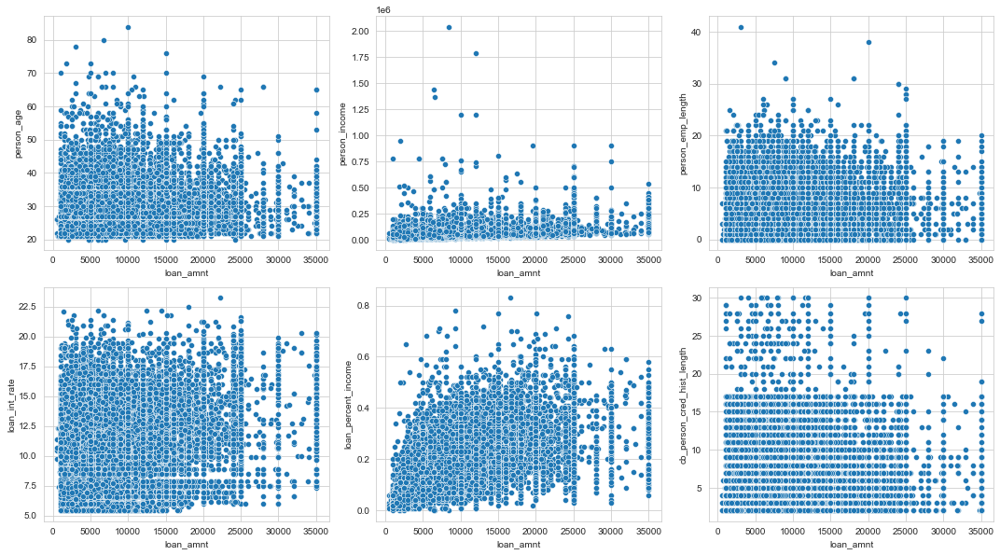

In [51]:
l=dt[conti_vari4].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  sns.scatterplot(dt['loan_amnt'],dt[conti_vari4][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

In [52]:
conti_vari5=['person_age','person_income','person_emp_length','loan_amnt','loan_percent_income','cb_person_cred_hist_length']

<ipython-input-53-42a3f3fb5f37>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-53-42a3f3fb5f37>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

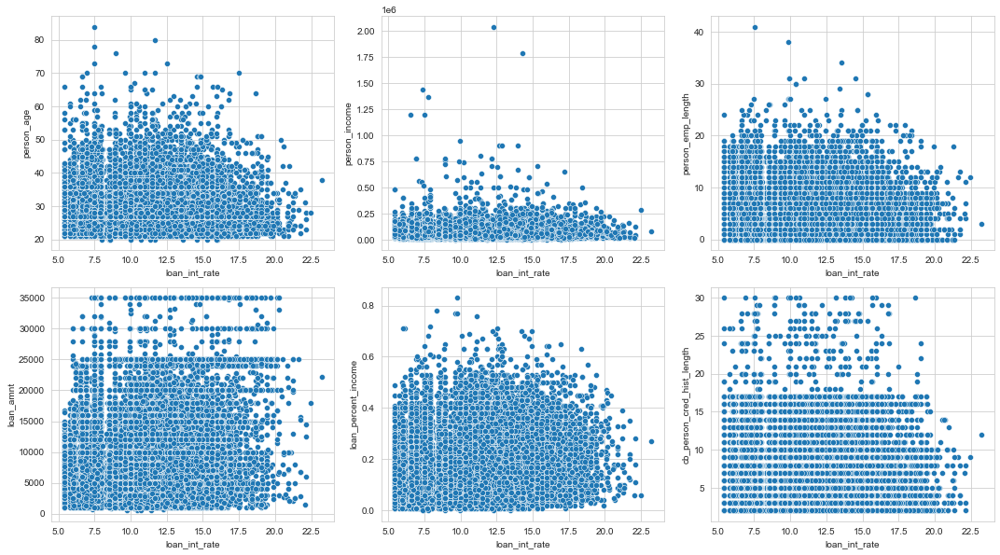

In [53]:
l=dt[conti_vari5].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  sns.scatterplot(dt['loan_int_rate'],dt[conti_vari5][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

In [54]:
conti_vari6=['person_age','person_income','person_emp_length','loan_amnt','loan_int_rate','cb_person_cred_hist_length']

<ipython-input-55-122a5bae1358>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-55-122a5bae1358>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

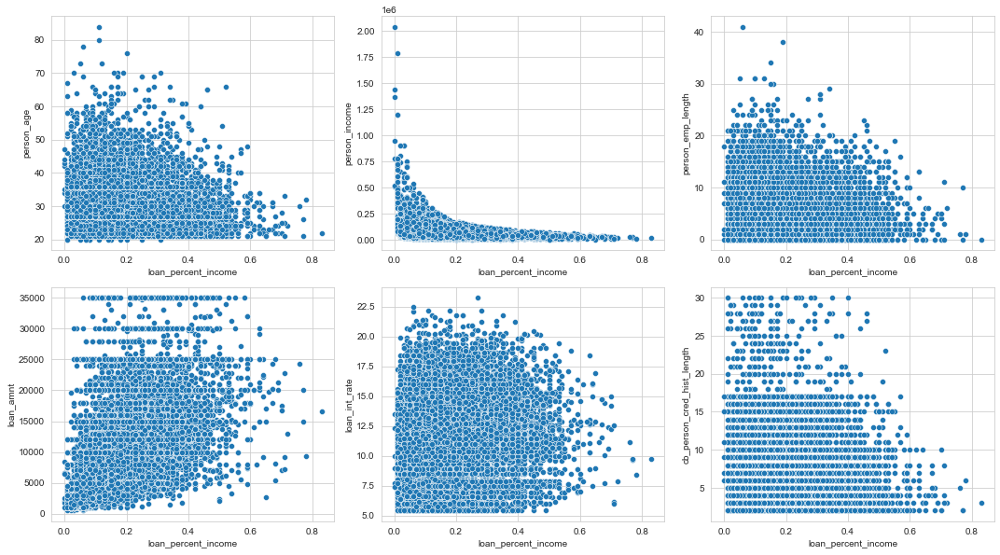

In [55]:
l=dt[conti_vari6].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  sns.scatterplot(dt['loan_percent_income'],dt[conti_vari6][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

In [56]:
conti_vari7=['person_age','person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income']

<ipython-input-57-73156403a6b3>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-57-73156403a6b3>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

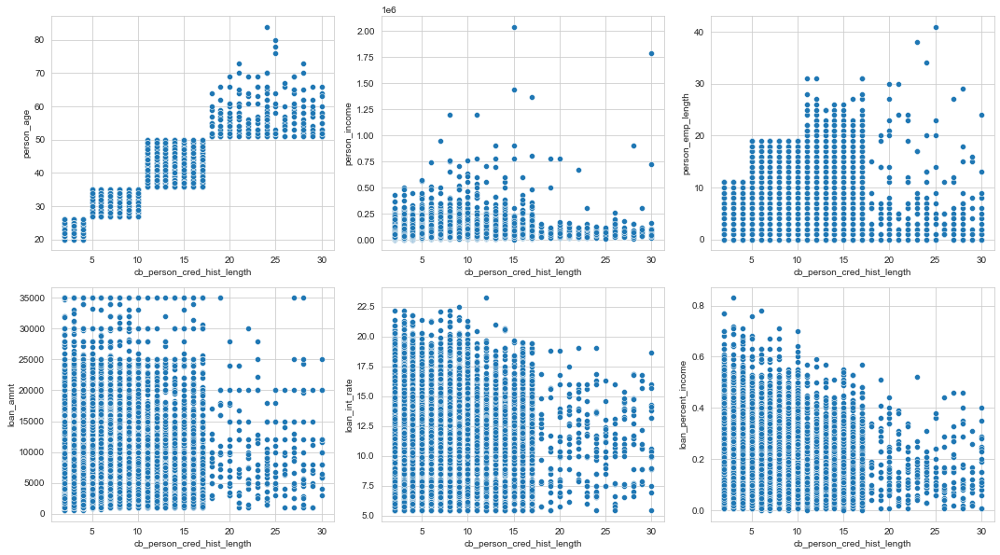

In [57]:
l=dt[conti_vari7].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  # sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  sns.scatterplot(dt['cb_person_cred_hist_length'],dt[conti_vari7][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

### Continuous variables vs loan status

<ipython-input-58-6b9b5c6804c8>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-58-6b9b5c6804c8>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-58-6b9b5c6804c8>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-58-6b9b5c6804c8>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-58-6b9b5c6804c8>:8: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-i

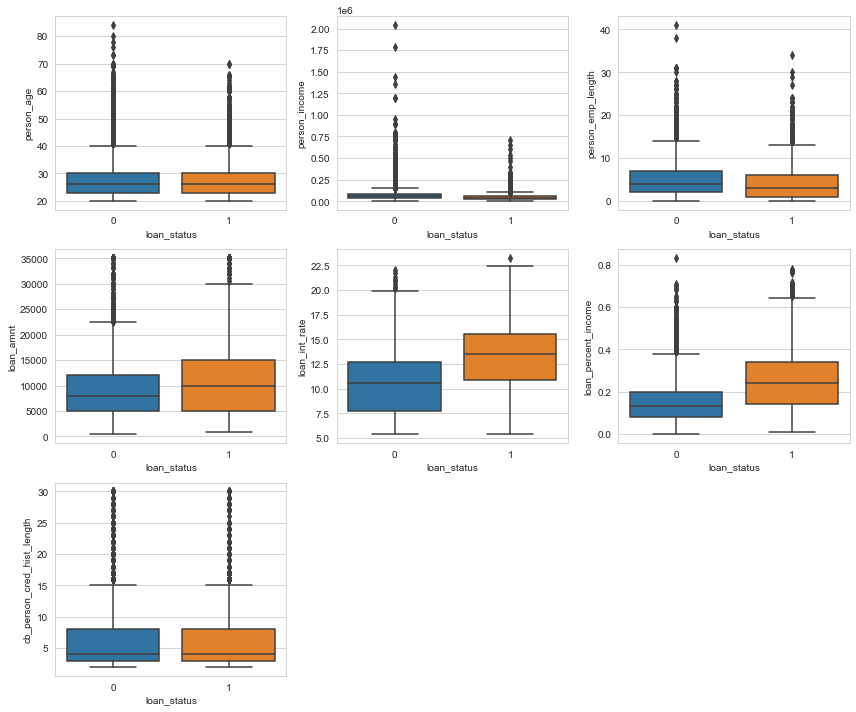

In [58]:
#box plot
l = dt[conti_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows = 2

plt.figure(figsize=(12,10))
for i in range(1,len(l)+1):
    plt.subplot(number_of_rows+1,number_of_columns,i)
    sns.boxplot(x=dt["loan_status"],y=dt[conti_vari][l[i-1]])
    # plt.title(l[i-1])
    plt.tight_layout()

In [59]:
conti_vari=['person_age','person_income','person_emp_length','loan_amnt','loan_int_rate','loan_percent_income','cb_person_cred_hist_length']

Continuous variables vs catagorical variables

<ipython-input-60-2da7d0741305>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-60-2da7d0741305>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

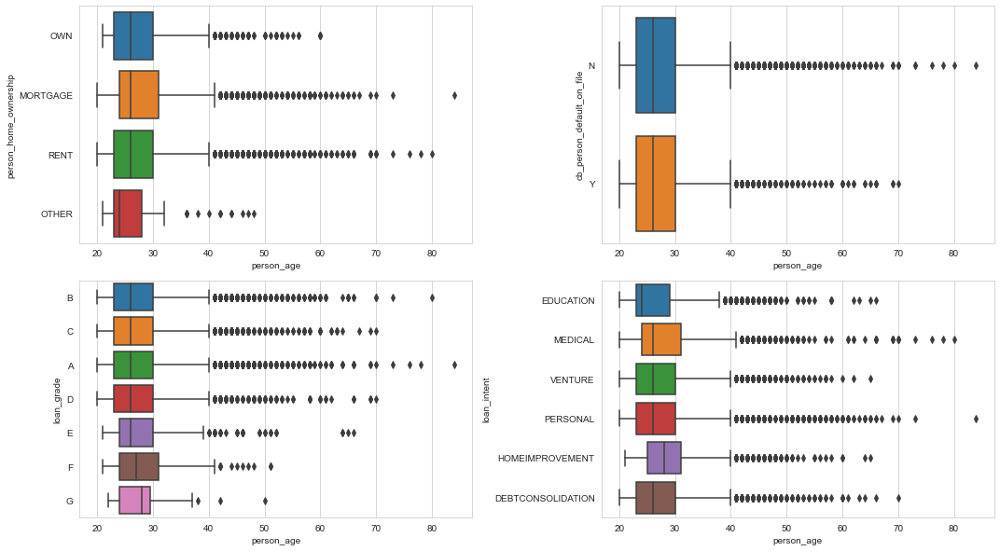

In [60]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  sns.boxplot(dt['person_age'],dt[cata_vari][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

<ipython-input-61-187bd892e183>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-61-187bd892e183>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

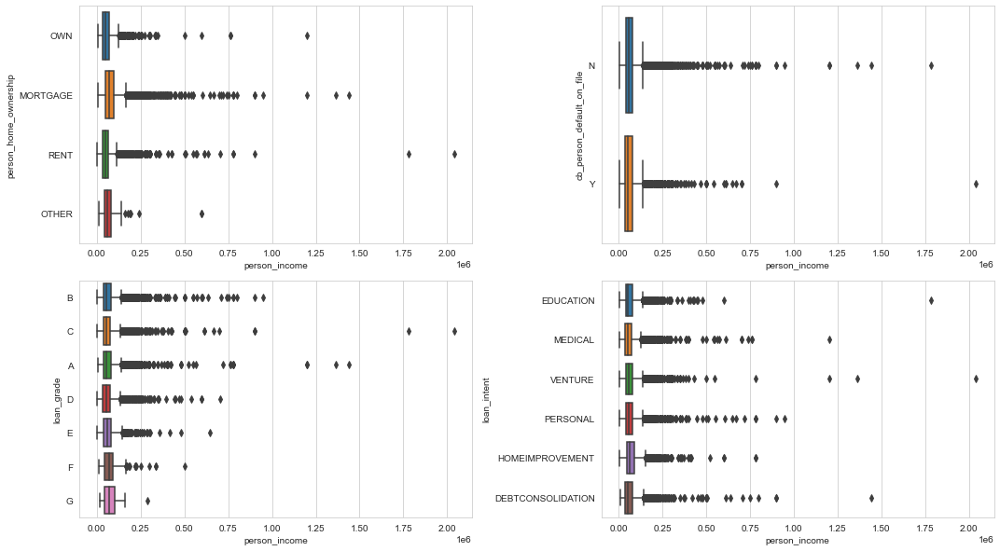

In [61]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  sns.boxplot(dt['person_income'],dt[cata_vari][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

<ipython-input-62-2908416cff04>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-62-2908416cff04>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

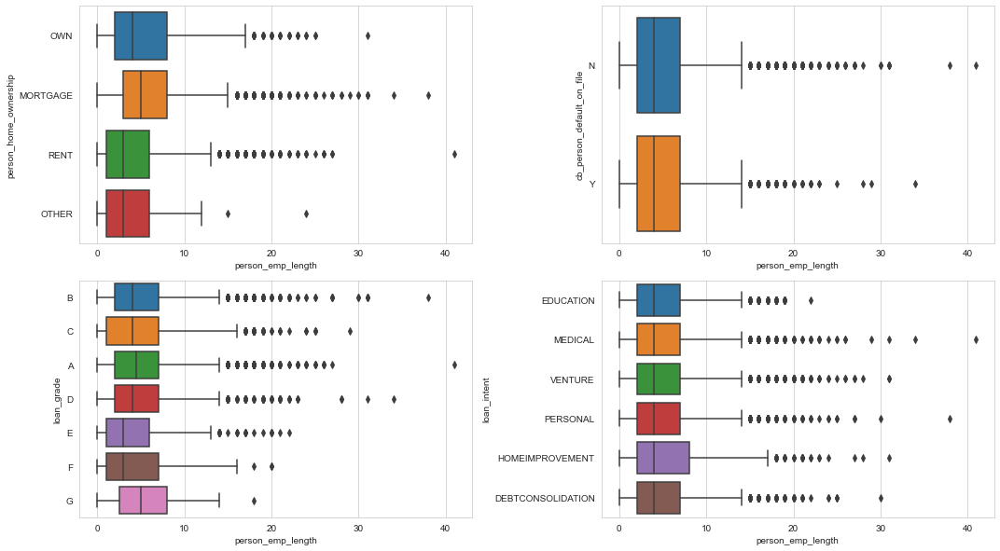

In [62]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  sns.boxplot(dt['person_emp_length'],dt[cata_vari][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

<ipython-input-63-c7803e8be430>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-63-c7803e8be430>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

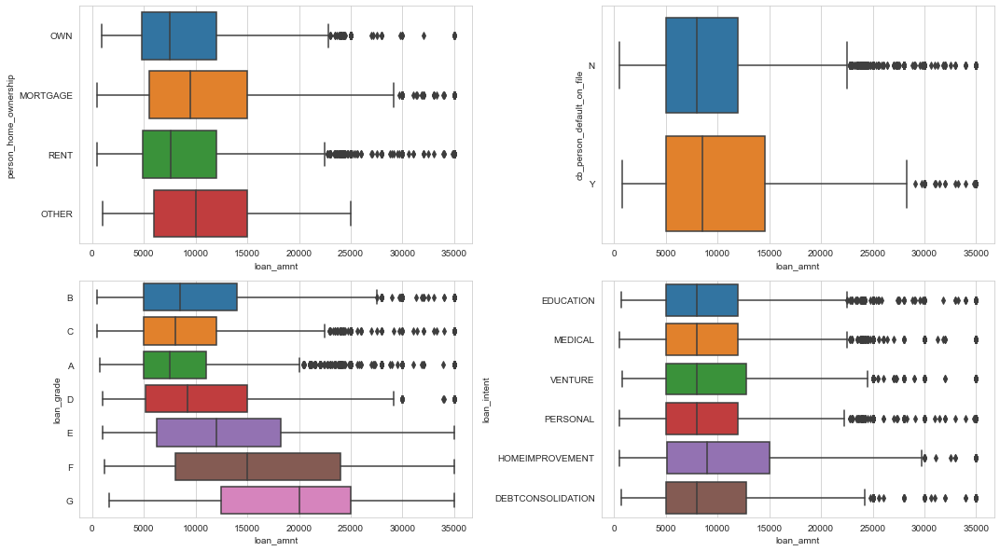

In [63]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  sns.boxplot(dt['loan_amnt'],dt[cata_vari][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

<ipython-input-64-5391b70109bb>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-64-5391b70109bb>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

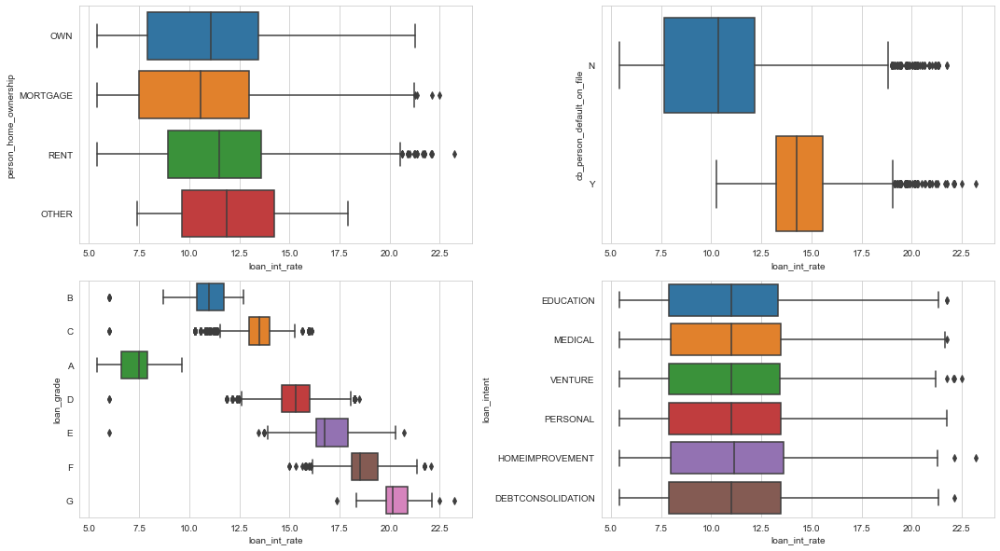

In [64]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  sns.boxplot(dt['loan_int_rate'],dt[cata_vari][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

<ipython-input-65-f3cebceba0a3>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-65-f3cebceba0a3>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

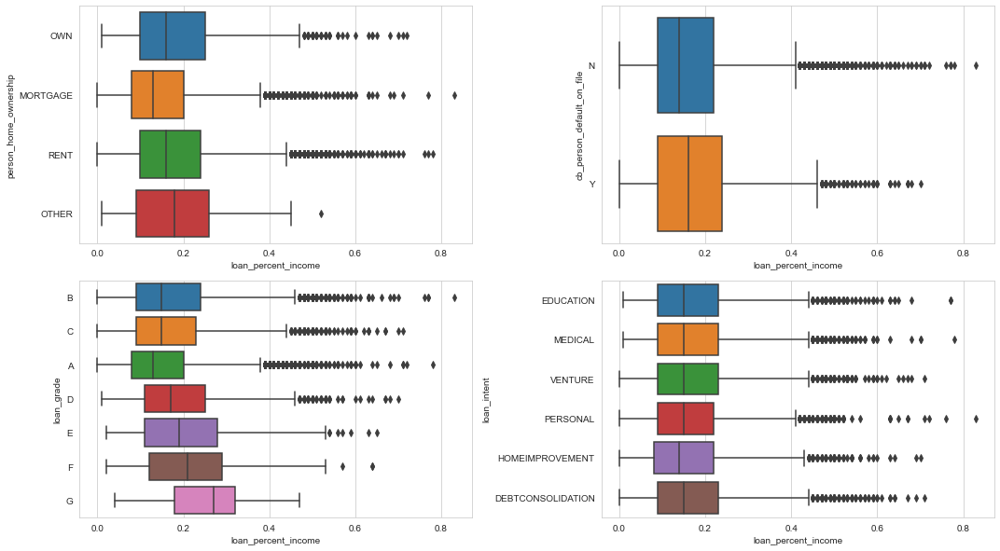

In [65]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  sns.boxplot(dt['loan_percent_income'],dt[cata_vari][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

<ipython-input-66-7047691c92cd>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

<ipython-input-66-7047691c92cd>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or mi

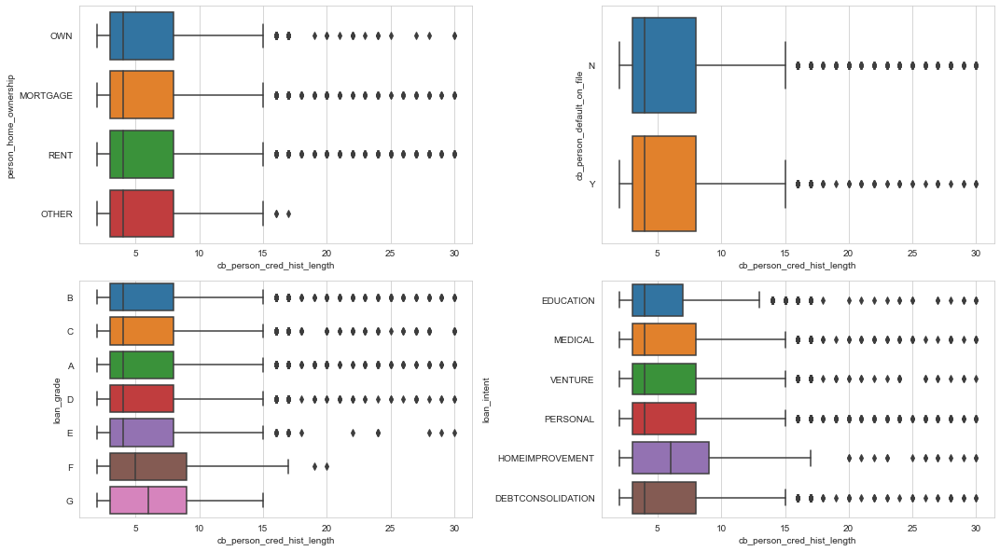

In [66]:
l=dt[cata_vari].columns.values
number_of_columns=(len(l))/2
number_of_rows=2

plt.figure(figsize=(15,12))
for i in range(1,len(l)+1):
  plt.subplot(number_of_rows+1,number_of_columns,i)
  sns.boxplot(dt['cb_person_cred_hist_length'],dt[cata_vari][l[i-1]])
  # plt.title(l[i-1])
  plt.tight_layout()

<ipython-input-67-e0027bc2d2f7>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-67-e0027bc2d2f7>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-67-e0027bc2d2f7>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-67-e0027bc2d2f7>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-input-67-e0027bc2d2f7>:7: MatplotlibDeprecationWarning:

Passing non-integers as three-element position specification is deprecated since 3.3 and will be removed two minor releases later.

<ipython-i

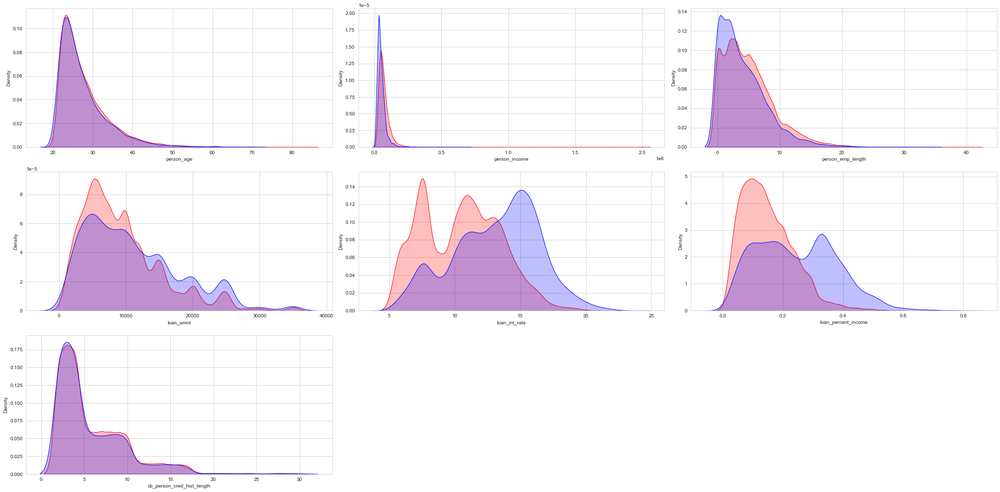

In [67]:
l = conti_vari
number_of_columns=(len(l))/2
number_of_rows = 3

plt.figure(figsize=(8*number_of_columns,6*number_of_rows))
for i in range(1,len(l)+1):
    plt.subplot(number_of_rows+1,number_of_columns,i)
    fig = sns.kdeplot(dt[l[i-1]][dt['loan_status'] == 0], shade=True, color="r", label='No default')
    fig = sns.kdeplot(dt[l[i-1]][dt['loan_status'] == 1], shade=True, color="b",label='Default')
    # plt.legend()
    plt.tight_layout()

As loan amount and loan interest rate increases the loan defaulters also increases.

No direct correlation with person age.

## **Multivariate Analysis**

C:\Users\omkar\anaconda3\lib\site-packages\seaborn\axisgrid.py:1912: UserWarning:

The `size` parameter has been renamed to `height`; please update your code.



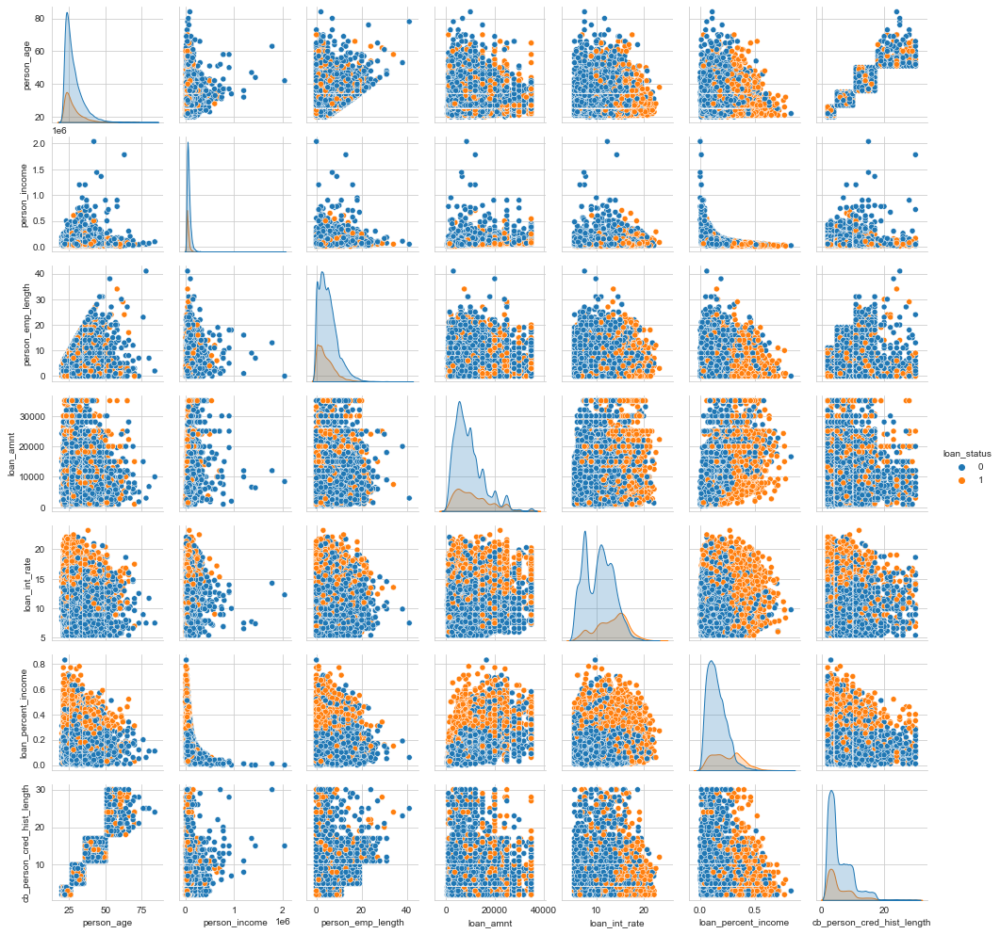

In [68]:
sns.pairplot(dt,hue='loan_status',size=2)

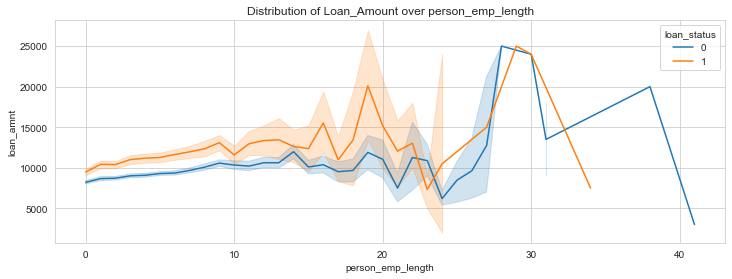

In [69]:
# Distribution of loan amount and person income over person emp length in relation to loan status
plt.subplots(figsize=(12, 9))

plt.subplot(2,1,1)
sns.lineplot(data=dt, x=dt['person_emp_length'], y=dt['loan_amnt'], hue=dt['loan_status'])
plt.title("Distribution of Loan_Amount over person_emp_length")

# plt.subplot(2,1,2)
# sns.lineplot(data=dt, x=dt['person_emp_length'], y=dt['person_income'], hue=dt['loan_status'])
# plt.title("Distribution of Person_Income over person_emp_length")

plt.show()

## Feature Engineering

In [70]:
dt.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
5,21,9900,OWN,2.0,VENTURE,A,2500,7.14,1,0.25,N,2


Encoding all categorical features to numberic

In [71]:
# Creating obj data type list (categorical features)
objList = dt.select_dtypes(include = "object").columns
print (objList)

Index(['person_home_ownership', 'loan_intent', 'loan_grade',
       'cb_person_default_on_file'],
      dtype='object')


In [72]:
#Label Encoding for object to numeric conversion

le = LabelEncoder()

for feat in objList:
    dt[feat] = le.fit_transform(dt[feat].astype(str))

print (dt.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28495 entries, 1 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  28495 non-null  int64  
 1   person_income               28495 non-null  int64  
 2   person_home_ownership       28495 non-null  int32  
 3   person_emp_length           28495 non-null  float64
 4   loan_intent                 28495 non-null  int32  
 5   loan_grade                  28495 non-null  int32  
 6   loan_amnt                   28495 non-null  int64  
 7   loan_int_rate               28495 non-null  float64
 8   loan_status                 28495 non-null  int64  
 9   loan_percent_income         28495 non-null  float64
 10  cb_person_default_on_file   28495 non-null  int32  
 11  cb_person_cred_hist_length  28495 non-null  int64  
dtypes: float64(3), int32(4), int64(5)
memory usage: 3.6 MB
None


In [73]:
# Check whether the conversion is successful or not

dt.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,2,5.0,1,1,1000,11.14,0,0.10,0,2
2,25,9600,0,1.0,3,2,5500,12.87,1,0.57,0,3
3,23,65500,3,4.0,3,2,35000,15.23,1,0.53,0,2
4,24,54400,3,8.0,3,2,35000,14.27,1,0.55,1,4
5,21,9900,2,2.0,5,0,2500,7.14,1,0.25,0,2


## Feature Selection

It is the way of selecting best relevant features from the given features.

In [74]:
# spliting features and target variable]
X = dt.drop("loan_status", axis=1)
Y = dt["loan_status"]

In [75]:
from sklearn.feature_selection import SelectKBest, chi2

In [76]:
# Chi2 test gives the relationship between two variables

selector = SelectKBest(chi2, k=10)
best_fit = selector.fit(X,Y)
best_features = list(X.columns[selector.get_support(indices=True)])
print(best_features)

['person_income', 'person_home_ownership', 'person_emp_length', 'loan_intent', 'loan_grade', 'loan_amnt', 'loan_int_rate', 'loan_percent_income', 'cb_person_default_on_file', 'cb_person_cred_hist_length']


In [77]:
scores_dt = pd.DataFrame(columns=['feature','score'])
scores_dt['feature'] = X.columns
scores_dt['score'] = best_fit.scores_
print(scores_dt.nlargest(11,'score'))

                       feature         score
1                person_income  3.205044e+07
6                    loan_amnt  1.534382e+06
5                   loan_grade  4.596080e+03
7                loan_int_rate  3.111940e+03
2        person_home_ownership  1.509746e+03
9    cb_person_default_on_file  7.773943e+02
3            person_emp_length  7.306427e+02
8          loan_percent_income  2.744492e+02
4                  loan_intent  1.413674e+02
10  cb_person_cred_hist_length  2.179742e+01
0                   person_age  2.123111e+01


In [78]:
# Hence, We can observe that 'cb_person_cred_hist_length','person_age','loan_intent' could be discarded

Selecting Best 8+1 features

In [79]:
new_dt = dt.drop(['cb_person_cred_hist_length','person_age','loan_intent'],axis=1)
new_dt.head()

,person_income,person_home_ownership,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file
1,9600,2,5.0,1,1000,11.14,0,0.10,0
2,9600,0,1.0,2,5500,12.87,1,0.57,0
3,65500,3,4.0,2,35000,15.23,1,0.53,0
4,54400,3,8.0,2,35000,14.27,1,0.55,1
5,9900,2,2.0,0,2500,7.14,1,0.25,0


Balancing Target Variable

In [80]:
new_dt.shape

(28495, 9)

Class 0:  22308
Class 1:  6187
Proportion:  3.61 :1


<AxesSubplot:title={'center':'Proportion of Target variable'}>

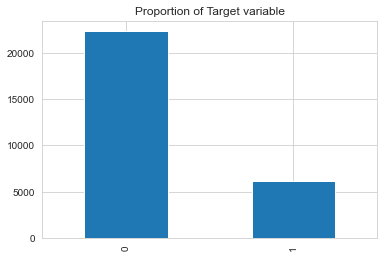

In [81]:
# Determine proportion of values of target variable

count_class_0 , count_class_1 = new_dt['loan_status'].value_counts()

print('Class 0: ',count_class_0)
print('Class 1: ',count_class_1)
print('Proportion: ',round(count_class_0/count_class_1,2),':1')

new_dt['loan_status'].value_counts().plot(kind='bar', title='Proportion of Target variable')


We have to apply Random Oversampling to deal with class imbalance problem

In [82]:
# Dividing the classes

dt_class_0 = new_dt[new_dt['loan_status'] == 0]
dt_class_1 = new_dt[new_dt['loan_status'] == 1]

dt_class_0.head()

,person_income,person_home_ownership,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file
1,9600,2,5.0,1,1000,11.14,0,0.10,0
14,115000,3,2.0,0,35000,7.90,0,0.30,0
15,500000,0,7.0,1,30000,10.65,0,0.06,0
16,120000,3,0.0,0,35000,7.90,0,0.29,0
20,162500,3,2.0,0,35000,7.49,0,0.22,0


Random over-sampling:
1    22308
0    22308
Name: loan_status, dtype: int64


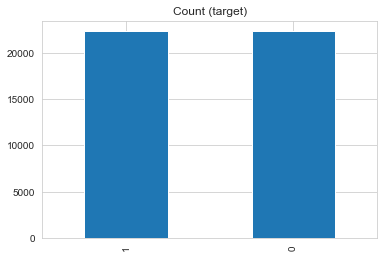

In [83]:
# Random Over-sampling

dt_class_1_over = dt_class_1.sample(count_class_0, replace=True)
new_dt = pd.concat([dt_class_0, dt_class_1_over], axis=0)

print('Random over-sampling:')
print(new_dt['loan_status'].value_counts())

new_dt['loan_status'].value_counts().plot(kind='bar', title='Count (target)');

In [84]:
# Resets the indexes to incrementing order
new_dt.reset_index(drop=True,inplace=True)

In [85]:
new_dt.shape

(44616, 9)

Train Test Splitting

In [86]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

In [87]:
X = new_dt.drop("loan_status", axis=1)
y = new_dt['loan_status']

In [88]:
# Spliting into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0, stratify=y)

In [89]:
# Scaling
scaler = MinMaxScaler(feature_range=(0,1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [90]:
X

,person_income,person_home_ownership,person_emp_length,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file
0,9600,2,5.0,1,1000,11.14,0.10,0
1,115000,3,2.0,0,35000,7.90,0.30,0
2,500000,0,7.0,1,30000,10.65,0.06,0
3,120000,3,0.0,0,35000,7.90,0.29,0
4,162500,3,2.0,0,35000,7.49,0.22,0
...,...,...,...,...,...,...,...,...
44611,46392,3,9.0,3,4000,16.32,0.09,1
44612,144000,3,0.0,6,13000,21.21,0.09,0
44613,88000,0,4.0,2,8400,14.65,0.10,0
44614,75000,0,2.0,1,7500,10.08,0.10,0


# Predictice Modeling 

Defining Functions

In [91]:
# creating function to calculate evaluation metrics
results = {}

def evaluation_metrics(y_act, y_pred, model=None):
      '''
          Takes actual target values and estimated target values as input
          and returns evaluation metrics as output
      '''

      #print("Evaluation Metrics on test data:")

      # accuracy score
      acc = accuracy_score(y_act, y_pred)
      #print(f"accuracy score: {acc}")

      # precision score
      prec = precision_score(y_act, y_pred)
      #print(f"Precision: {prec}")

      # recall
      recall = recall_score(y_act, y_pred)
      #print(f"Recall: {recall}")

      # f1 score
      f1 = f1_score(y_act, y_pred)
      #print(f"f1 score: {f1}")

      # appending result into dictionary
      results = [acc,prec,recall,f1]

      return results
    

In [92]:
# function to plot roc curve
def plot_roc_curve(y_act, pred_proba):

  ''' 
  This function computes and plots the receiver operating characteristic curve, or ROC curve.
  '''

  fpr, tpr, threshold = roc_curve(y_act, pred_proba)
  roc_auc = roc_auc_score(y_act, pred_proba)

  # Printing AUC
  print(f"roc-auc score: {roc_auc}")

  # Plotting the ROC
  plt.figure(figsize=(8,6))
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)

  plt.plot([0,1], [0,1], color='orange', linestyle='--')

  plt.xticks(np.arange(0.0, 1.1, step=0.1))
  plt.xlabel("False Positive Rate", fontsize=15)

  plt.yticks(np.arange(0.0, 1.1, step=0.1))
  plt.ylabel("True Positive Rate", fontsize=15)

  plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
  plt.legend(prop={'size':13}, loc='lower right')

  plt.show()

In [93]:
# function to plot feature importance
def plot_feature_importance(model,X):

  ''' plots feature importance graph '''


  importances = list(model.feature_importances_)

  feature_importances= {'feature':list(X.columns), 'feature_importance':importances}

  importance_df= pd.DataFrame(feature_importances)
  importance_df.sort_values(by='feature_importance', ascending=False, inplace=True)

  plt.figure(figsize=(12,6))
  sns.barplot(x='feature_importance', y='feature', data=importance_df)
  
  plt.xlabel("Importance")
  model_name= model.__class__.__name__
  plt.title(f"Feature Importance {model_name}",fontweight='bold', fontsize=15)
  plt.tight_layout()

  plt.show()

**Logistic Regression**

In [94]:
# create logistic regression model
clf = LogisticRegression(fit_intercept=True, max_iter=10000, random_state=0)

# fit model
lr_clf = clf.fit(X_train,y_train)

In [95]:
# predicted classes
train_pred_lr = lr_clf.predict(X_train)
test_pred_lr = lr_clf.predict(X_test)

In [96]:
# Predicted Probability
test_proba_lr = lr_clf.predict_proba(X_test)[:,1]

In [97]:
# train set accuracy score
accuracy_score(y_train,train_pred_lr)

0.7753272368656984

Model Evaluation of Logistic Regression

In [98]:
# Evaluation metrics
results_lr = evaluation_metrics(y_test, test_pred_lr, "Logistic Regression")

In [99]:
print("Accuracy : ",results_lr[0])
print("Precision : ",results_lr[1])
print("Recall : ",results_lr[2])
print("F1 Score : ",results_lr[3])

Accuracy :  0.7834857450242065
Precision :  0.786620739666425
Recall :  0.7780168549399319
F1 Score :  0.7822951410799603


*Confusion Matrix*

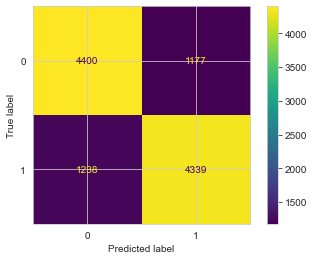

In [100]:
# visualize the confusion matrix
cm = confusion_matrix(y_test, test_pred_lr)
disp = ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

*AUC-ROC Curve*

roc-auc score: 0.8538936799167691


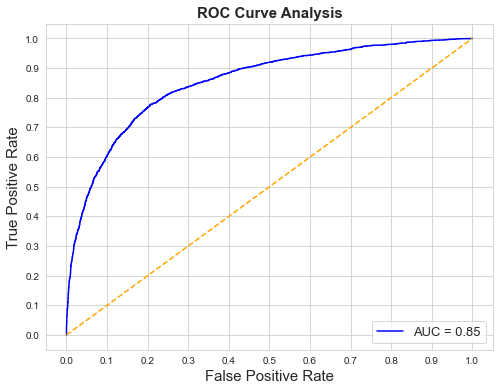

In [101]:
plot_roc_curve(y_test, test_proba_lr)

**K-Nearest Neighbours (KNN)**

In [102]:
#create parameter grid
param_grid = {'n_neighbors': np.arange(16, 31)}

In [103]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

In [104]:
#create new a knn model
knn_clf = KNeighborsClassifier()

#use gridsearch to test all values for n_neighbors
knn_gscv = GridSearchCV(knn_clf, param_grid, cv=5)

#fit model to data
knn_gscv.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30])})

In [105]:
#checking top performing n_neighbors value
knn_gscv.best_params_

{'n_neighbors': 16}

In [106]:
# optimal model
knn_optimal_model = knn_gscv.best_estimator_

In [107]:
# predicted classes
train_pred_knn = knn_optimal_model.predict(X_train)
test_pred_knn = knn_optimal_model.predict(X_test)

In [108]:
# Predicted Probability
test_proba_knn = knn_optimal_model.predict_proba(X_test)[:,1]

In [109]:
# train set accuracy score
accuracy_score(y_train,train_pred_knn)

0.8510549279780049

**Model Evaluation of KNN**

In [110]:
# Evaluation metrics
results_knn = evaluation_metrics(y_test, test_pred_knn, "K-Nearest Neighbors")

In [111]:
print("Accuracy : ",results_knn[0])
print("Precision : ",results_knn[1])
print("Recall : ",results_knn[2])
print("F1 Score : ",results_knn[3])

Accuracy :  0.8325264479110633
Precision :  0.8502360717658168
Recall :  0.8072440380132688
F1 Score :  0.8281824871228846


*Confusion Matrix*

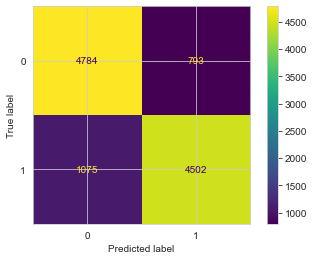

In [112]:
# visualize the confusion matrix
cm = confusion_matrix(y_test, test_pred_knn)
disp = ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

*AUC-ROC Curve*

roc-auc score: 0.9173013576952832


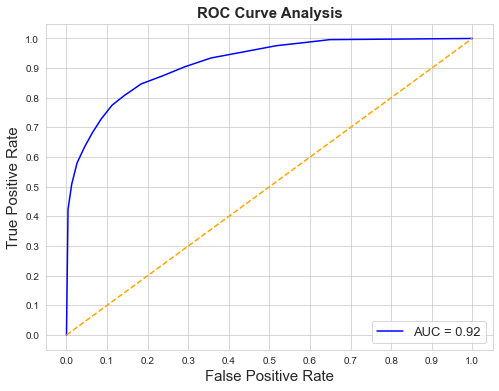

In [113]:
plot_roc_curve(y_test, test_proba_knn)

 **Support Vectors Classifier (SVC)**

In [114]:
# create SVC model
svc_model = SVC(probability=True)

# fitting model
svc_model.fit(X_train, y_train)

SVC(probability=True)

In [115]:
# predicted classes
train_pred_svc = svc_model.predict(X_train)
test_pred_svc = svc_model.predict(X_test)

In [116]:
# Predicted Probability
test_proba_svc = svc_model.predict_proba(X_test)[:,1]

In [117]:
# train set accuracy score
accuracy_score(y_train,train_pred_svc)

0.816777239854163

Model Evaluation

In [118]:
# Evaluation metrics
results_svc = evaluation_metrics(y_test, test_pred_svc, "SVC")

In [119]:
print("Accuracy : ",results_svc[0])
print("Precision : ",results_svc[1])
print("Recall : ",results_svc[2])
print("F1 Score : ",results_svc[3])

Accuracy :  0.8227541689080151
Precision :  0.8682487725040916
Recall :  0.7609826071364533
F1 Score :  0.8110845676063067


Confusion Matrix

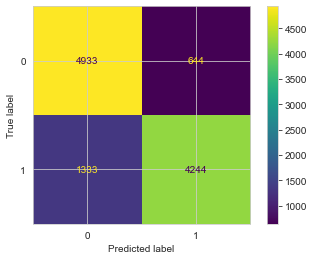

In [120]:
# visualize the confusion matrix
cm = confusion_matrix(y_test, test_pred_svc)
disp = ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

AUC-ROC Curve

roc-auc score: 0.8863639016119672


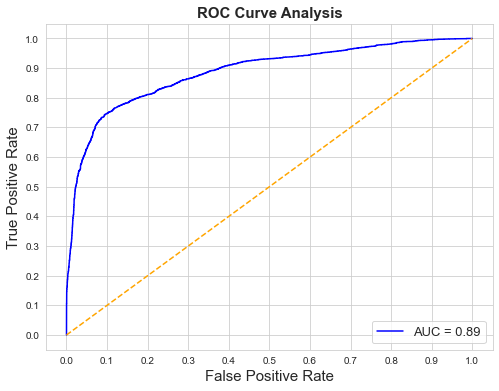

In [121]:
plot_roc_curve(y_test, test_proba_svc)

**Decision Tree Classifier**

In [122]:
# hyperparameter grid
param_dict_dt = {'max_depth': [10, 15, 20, 25],
                 'min_samples_leaf': [30, 40, 50],
                 'criterion': ["gini", "entropy"]
                 }

In [123]:
# creating model instance
dt_clf= DecisionTreeClassifier(random_state=0)

# fitting model
dt_grid = GridSearchCV(dt_clf, param_dict_dt, scoring= 'accuracy', verbose=3, cv=5)
dt_grid.fit(X_train, y_train)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
[CV] criterion=gini, max_depth=10, min_samples_leaf=30 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=30, score=0.845, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=30 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=30, score=0.833, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=30 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=30, score=0.835, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=30 ...............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s


[CV]  criterion=gini, max_depth=10, min_samples_leaf=30, score=0.848, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=30 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=30, score=0.838, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=40 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=40, score=0.845, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=40 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=40, score=0.830, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=40 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=40, score=0.835, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=40 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=40, score=0.847, total=   0.1s
[CV] criterion=gini, max_depth=10, min_samples_leaf=40 ...............
[CV]  criterion=gini, max_depth=10, min_samples_leaf=40, score=0.835, 

[CV]  criterion=gini, max_depth=25, min_samples_leaf=50, score=0.834, total=   0.1s
[CV] criterion=gini, max_depth=25, min_samples_leaf=50 ...............
[CV]  criterion=gini, max_depth=25, min_samples_leaf=50, score=0.849, total=   0.1s
[CV] criterion=gini, max_depth=25, min_samples_leaf=50 ...............
[CV]  criterion=gini, max_depth=25, min_samples_leaf=50, score=0.840, total=   0.1s
[CV] criterion=entropy, max_depth=10, min_samples_leaf=30 ............
[CV]  criterion=entropy, max_depth=10, min_samples_leaf=30, score=0.842, total=   0.1s
[CV] criterion=entropy, max_depth=10, min_samples_leaf=30 ............
[CV]  criterion=entropy, max_depth=10, min_samples_leaf=30, score=0.834, total=   0.1s
[CV] criterion=entropy, max_depth=10, min_samples_leaf=30 ............
[CV]  criterion=entropy, max_depth=10, min_samples_leaf=30, score=0.835, total=   0.1s
[CV] criterion=entropy, max_depth=10, min_samples_leaf=30 ............
[CV]  criterion=entropy, max_depth=10, min_samples_leaf=30, s

[CV]  criterion=entropy, max_depth=25, min_samples_leaf=40, score=0.844, total=   0.1s
[CV] criterion=entropy, max_depth=25, min_samples_leaf=40 ............
[CV]  criterion=entropy, max_depth=25, min_samples_leaf=40, score=0.838, total=   0.1s
[CV] criterion=entropy, max_depth=25, min_samples_leaf=40 ............
[CV]  criterion=entropy, max_depth=25, min_samples_leaf=40, score=0.834, total=   0.1s
[CV] criterion=entropy, max_depth=25, min_samples_leaf=40 ............
[CV]  criterion=entropy, max_depth=25, min_samples_leaf=40, score=0.848, total=   0.1s
[CV] criterion=entropy, max_depth=25, min_samples_leaf=40 ............
[CV]  criterion=entropy, max_depth=25, min_samples_leaf=40, score=0.846, total=   0.1s
[CV] criterion=entropy, max_depth=25, min_samples_leaf=50 ............
[CV]  criterion=entropy, max_depth=25, min_samples_leaf=50, score=0.841, total=   0.1s
[CV] criterion=entropy, max_depth=25, min_samples_leaf=50 ............
[CV]  criterion=entropy, max_depth=25, min_samples_l

[Parallel(n_jobs=1)]: Done 120 out of 120 | elapsed:    8.9s finished


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=0),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 15, 20, 25],
                         'min_samples_leaf': [30, 40, 50]},
             scoring='accuracy', verbose=3)

In [124]:
# best_parameters
dt_grid.best_params_

{'criterion': 'gini', 'max_depth': 20, 'min_samples_leaf': 30}

In [125]:
# optimal model
dt_optimal= dt_grid.best_estimator_

In [126]:
# predicted classes
train_pred_dt = dt_optimal.predict(X_train)
test_pred_dt = dt_optimal.predict(X_test)

In [127]:
# Predicted Probability
test_proba_dt = dt_optimal.predict_proba(X_test)[:,1]

In [128]:
# train set accuracy score
accuracy_score(y_train,train_pred_dt)

0.8726914111529496

Model Evaluation

In [129]:
# Evaluation metrics on test set
results_dt = evaluation_metrics(y_test, test_pred_dt, "DecisionTree")

In [130]:
print("Accuracy : ",results_dt[0])
print("Precision : ",results_dt[1])
print("Recall : ",results_dt[2])
print("F1 Score : ",results_dt[3])

Accuracy :  0.8542227003765466
Precision :  0.8754989545713743
Recall :  0.8258920566612874
F1 Score :  0.8499723196161654


Confusion Matrix

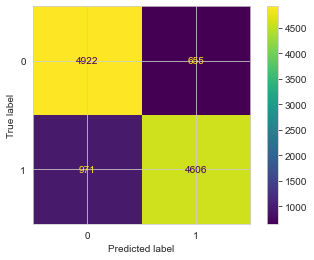

In [131]:
# visualize the confusion matrix
cm = confusion_matrix(y_test, test_pred_dt)
disp = ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

AUC-ROC Curve

roc-auc score: 0.9403082423523521


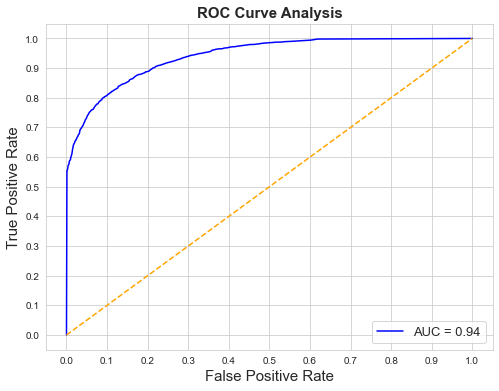

In [132]:
plot_roc_curve(y_test, test_proba_dt)

**Random Forest Classifier**

In [133]:
# hyperparameter grid
param_dict_rf = {
    'n_estimators': [100, 150, 200],
    'max_depth': [int(x) for x in np.linspace(3, 15, num = 13)],
    'min_samples_leaf': [10, 20, 30]
  }

In [134]:
# create RandomForestClassifier instance
rf_model= RandomForestClassifier(random_state=0)

# fitting model
rf_grid = RandomizedSearchCV(rf_model, param_dict_rf, cv = 3, verbose=2)

rf_grid.fit(X_train,y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] n_estimators=100, min_samples_leaf=10, max_depth=4 ..............


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=100, min_samples_leaf=10, max_depth=4, total=   0.9s
[CV] n_estimators=100, min_samples_leaf=10, max_depth=4 ..............


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.8s remaining:    0.0s


[CV]  n_estimators=100, min_samples_leaf=10, max_depth=4, total=   0.9s
[CV] n_estimators=100, min_samples_leaf=10, max_depth=4 ..............
[CV]  n_estimators=100, min_samples_leaf=10, max_depth=4, total=   0.9s
[CV] n_estimators=150, min_samples_leaf=10, max_depth=5 ..............
[CV]  n_estimators=150, min_samples_leaf=10, max_depth=5, total=   1.6s
[CV] n_estimators=150, min_samples_leaf=10, max_depth=5 ..............
[CV]  n_estimators=150, min_samples_leaf=10, max_depth=5, total=   1.4s
[CV] n_estimators=150, min_samples_leaf=10, max_depth=5 ..............
[CV]  n_estimators=150, min_samples_leaf=10, max_depth=5, total=   1.4s
[CV] n_estimators=200, min_samples_leaf=10, max_depth=4 ..............
[CV]  n_estimators=200, min_samples_leaf=10, max_depth=4, total=   1.7s
[CV] n_estimators=200, min_samples_leaf=10, max_depth=4 ..............
[CV]  n_estimators=200, min_samples_leaf=10, max_depth=4, total=   1.8s
[CV] n_estimators=200, min_samples_leaf=10, max_depth=4 ..............

[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:  1.0min finished


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=0),
                   param_distributions={'max_depth': [3, 4, 5, 6, 7, 8, 9, 10,
                                                      11, 12, 13, 14, 15],
                                        'min_samples_leaf': [10, 20, 30],
                                        'n_estimators': [100, 150, 200]},
                   verbose=2)

In [135]:
# best parameters
rf_grid.best_params_

{'n_estimators': 200, 'min_samples_leaf': 10, 'max_depth': 14}

In [136]:
# optimal model
rf_optimal= rf_grid.best_estimator_

In [137]:
# predicted classes
train_pred_rf = rf_optimal.predict(X_train)
test_pred_rf = rf_optimal.predict(X_test)

In [138]:
# Predicted Probability
test_proba_rf = rf_optimal.predict_proba(X_test)[:,1]

In [139]:
# train set accuracy score
accuracy_score(y_train,train_pred_rf)

0.8830912677066524

Model Evaluation

In [140]:
# Evaluation metrics
results_rf = evaluation_metrics(y_test, test_pred_rf, "RandomForest")

In [141]:
print("Accuracy : ",results_rf[0])
print("Precision : ",results_rf[1])
print("Recall : ",results_rf[2])
print("F1 Score : ",results_rf[3])

Accuracy :  0.8694638694638694
Precision :  0.9158425832492432
Recall :  0.8136991213914291
F1 Score :  0.8617546524876567


Confusion Matrix

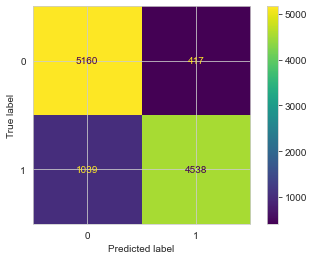

In [142]:
# visualize the confusion matrix
cm = confusion_matrix(y_test, test_pred_rf)
disp = ConfusionMatrixDisplay(confusion_matrix = cm)
disp.plot()
plt.show()

AUC-ROC Curve

roc-auc score: 0.9540567545905403


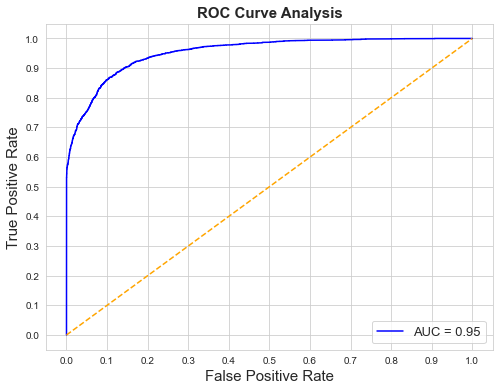

In [143]:
plot_roc_curve(y_test, test_proba_rf)

Feature Importance

In [144]:
rf_optimal.feature_importances_

array([0.17300941, 0.10005468, 0.0381885 , 0.17905151, 0.07028811,
       0.15611161, 0.26724646, 0.01604972])

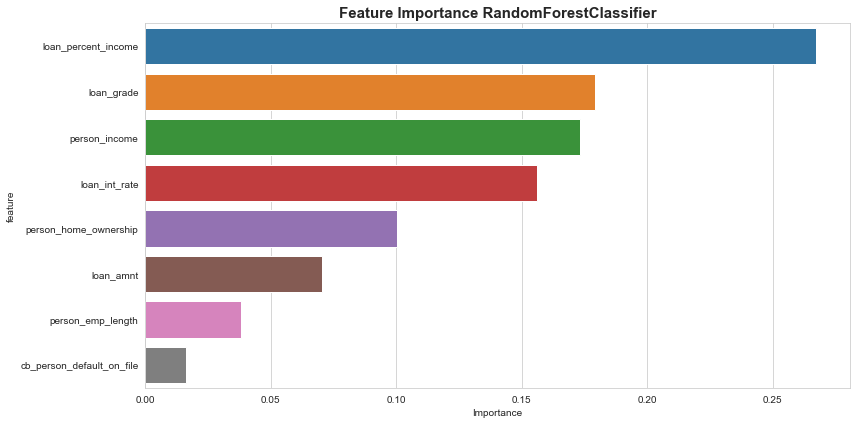

In [145]:
plot_feature_importance(rf_optimal,X)

XG Boost Algorithm

In [146]:
xg_model = XGBClassifier(n_estimators=1000, learning_rate=0.05)

In [147]:
xg_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.05, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=1000, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [148]:
# Predicted class
test_pred_xg = xg_model.predict(X_test)
train_pred_xg = xg_model.predict(X_train)

In [149]:
# Predicted Probability
test_proba_xg = xg_model.predict_proba(X_test)[:,1]

In [150]:
print('                   ', 'XGBoost', '\n',
classification_report(y_test, xg_model.predict(X_test)))

                    XGBoost 
               precision    recall  f1-score   support

           0       0.92      0.93      0.92      5577
           1       0.93      0.92      0.92      5577

    accuracy                           0.92     11154
   macro avg       0.92      0.92      0.92     11154
weighted avg       0.92      0.92      0.92     11154



In [151]:
# Evaluation metrics
results_xg = evaluation_metrics(y_test, test_pred_xg, "XGBoost")

In [152]:
print("Accuracy : ",results_xg[0])
print("Precision : ",results_xg[1])
print("Recall : ",results_xg[2])
print("F1 Score : ",results_xg[3])

Accuracy :  0.9228976152053076
Precision :  0.9279622573035746
Recall :  0.9169804554419939
F1 Score :  0.9224386724386724


## Comparing All models

Text(0.5, 1.0, 'Accuracy Comparison')

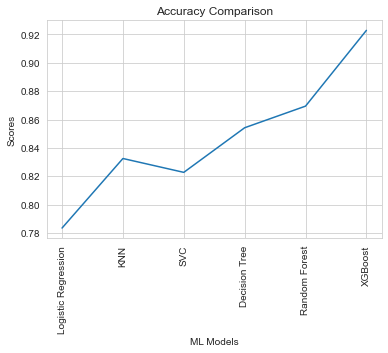

In [153]:
y_acc = [results_lr[0],results_knn[0],results_svc[0],results_dt[0],results_rf[0],results_xg[0]]
x_acc = ['Logistic Regression','KNN','SVC','Decision Tree','Random Forest','XGBoost']

plt.xticks(range(len(x_acc)), x_acc, rotation='vertical')

plt.plot(x_acc,y_acc)

plt.xlabel('ML Models')
plt.ylabel('Scores')

plt.title('Accuracy Comparison')

Text(0.5, 1.0, 'Precision Comparison')

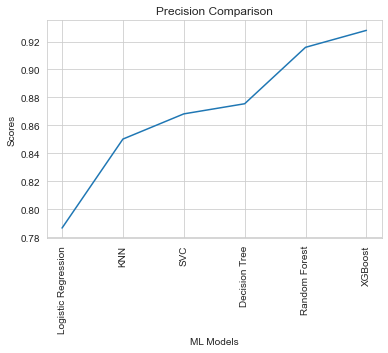

In [154]:
y_pr = [results_lr[1],results_knn[1],results_svc[1],results_dt[1],results_rf[1],results_xg[1]]
x_pr = ['Logistic Regression','KNN','SVC','Decision Tree','Random Forest','XGBoost']

plt.xticks(range(len(x_pr)), x_pr, rotation='vertical')

plt.plot(x_pr,y_pr)

plt.xlabel('ML Models')
plt.ylabel('Scores')

plt.title('Precision Comparison')

Text(0.5, 1.0, 'Recall Comparison')

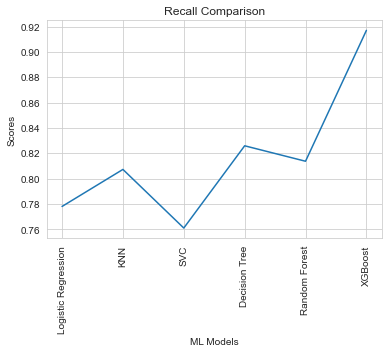

In [155]:
y_re = [results_lr[2],results_knn[2],results_svc[2],results_dt[2],results_rf[2],results_xg[2]]
x_re = ['Logistic Regression','KNN','SVC','Decision Tree','Random Forest','XGBoost']

plt.xticks(range(len(x_re)), x_re, rotation='vertical')

plt.plot(x_re,y_re)

plt.xlabel('ML Models')
plt.ylabel('Scores')

plt.title('Recall Comparison')

Text(0.5, 1.0, 'F1 Score Comparison')

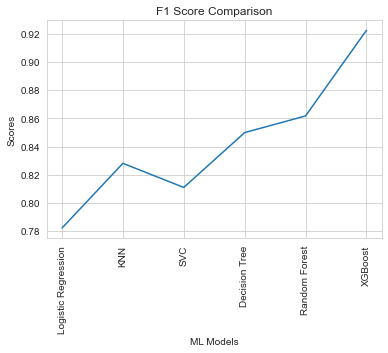

In [156]:
y_f1 = [results_lr[3],results_knn[3],results_svc[3],results_dt[3],results_rf[3],results_xg[3]]
x_f1 = ['Logistic Regression','KNN','SVC','Decision Tree','Random Forest','XGBoost']

plt.xticks(range(len(x_f1)), x_f1, rotation='vertical')

plt.plot(x_f1,y_f1)

plt.xlabel('ML Models')
plt.ylabel('Scores')

plt.title('F1 Score Comparison')

### Creating  Model for saving.

In [157]:
import pickle 

In [158]:
pickle.dump(xg_model,open('model_jupyter_loan_1.pkl','wb'))

### Loading back the model and checking

In [159]:
model_loaded = pickle.load(open('model_jupyter_loan_1.pkl','rb'))